Experimental Dataset - 2D class - class 39- 128x128

# Setup

In [1]:
%matplotlib inline
import os, sys, glob, shutil
from matplotlib import pyplot as plt
import numpy as np
import torch
import h5py
from sklearn import metrics
sys.path.append('../utils/')
import functions_for_fred as fn
import nn
import viz
import pred

In [2]:
print('we are here {}'.format(os.getcwd()))

we are here /gpfs/slac/cryo/fs1/g/ML/vaegan/analysis


In [21]:
KEYWORD      = 'cryo_exp_class_2d_39_128x128'
CHECKPT_FILE = 'cryo_exp_class_2d_39_epoch_255_checkpoint.pth'
EPOCH_NUMBER = 255

In [22]:
DATASET_DIR     = '../train_val_datasets/'
METADATASET_DIR = '../datasets/exp/20181005-rib-TEM4/Sort/'
TRAINED_DIR = '../train_vae/'
TRAIN_DATASET_PATH     = DATASET_DIR+KEYWORD+'.npy'
TRAIN_METADATASET_PATH = METADATASET_DIR+'class2D_39_sort.h5'
TRAINED_CHECKPOINT     = 'epoch_'+str(EPOCH_NUMBER)+'_checkpoint.pth'
if not os.path.exists(KEYWORD):
    os.makedirs(KEYWORD)
if not os.path.exists(KEYWORD+'/train_vae'):
    os.makedirs(KEYWORD+'/train_vae')
if not os.path.isfile(KEYWORD+'/train_vae/'+TRAINED_CHECKPOINT):
    shutil.copyfile(TRAINED_DIR+CHECKPT_FILE, KEYWORD+'/train_vae/'+TRAINED_CHECKPOINT)

# Load dataset, encoder and decoder

In [23]:
dataset = np.load(TRAIN_DATASET_PATH)
metadata = h5py.File(TRAIN_METADATASET_PATH, 'r')
print('dataset.shape {} metadata.shape {}'.format(dataset.shape, metadata['particles'].shape))

dataset.shape (5119, 1, 128, 128) metadata.shape (5119, 180, 180)


In [24]:
mus = []
mus = fn.latent_projection(KEYWORD, TRAIN_DATASET_PATH, epoch_id=EPOCH_NUMBER)
mus.shape

cryo_exp_class_2d_39_128x128/train_vae/epoch_255_checkpoint.pth
Found checkpoint. Getting: cryo_exp_class_2d_39_128x128/train_vae/epoch_255_checkpoint.pth.
Loading encoder from network of architecture: conv_orig...


(5119, 4)

In [25]:
recon = []
recon = fn.reconstruction(KEYWORD, torch.Tensor(mus[0:500,...]).cuda(), epoch_id=EPOCH_NUMBER)
recon.shape

cryo_exp_class_2d_39_128x128/train_vae/epoch_255_checkpoint.pth
Found checkpoint. Getting: cryo_exp_class_2d_39_128x128/train_vae/epoch_255_checkpoint.pth.
Loading decoder from network of architecture: conv_orig...


(500, 1, 128, 128)

In [26]:
list(metadata.keys())

['_rlnamplitudecontrast',
 '_rlnanglepsi',
 '_rlnanglerot',
 '_rlnangletilt',
 '_rlnautopickfigureofmerit',
 '_rlnclassnumber',
 '_rlncoordinatex',
 '_rlncoordinatey',
 '_rlnctfbfactor',
 '_rlnctffigureofmerit',
 '_rlnctfmaxresolution',
 '_rlnctfscalefactor',
 '_rlndefocusangle',
 '_rlndefocusu',
 '_rlndefocusv',
 '_rlndetectorpixelsize',
 '_rlngroupnumber',
 '_rlnimagename',
 '_rlnloglikelicontribution',
 '_rlnmagnification',
 '_rlnmaxvalueprobdistribution',
 '_rlnmicrographname',
 '_rlnnormcorrection',
 '_rlnnrofsignificantsamples',
 '_rlnoriginx',
 '_rlnoriginy',
 '_rlnparticleselectzscore',
 '_rlnphaseshift',
 '_rlnsphericalaberration',
 '_rlnvoltage',
 'particles']

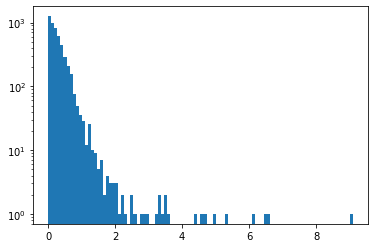

0.29390269770115257 0.38519839204161177


In [27]:
Zscore = np.array(metadata['_rlnparticleselectzscore'])
plt.hist(Zscore, bins=100, log=True)
plt.show()
print(np.mean(Zscore), np.std(Zscore))

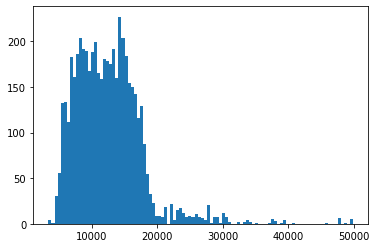

3333.739502 12408.233953110177 5213.635159191951


In [28]:
defocus = np.array(metadata['_rlndefocusu'])
plt.hist(defocus, bins=100, log=False)
plt.show()
print(np.min(defocus),np.mean(defocus), np.std(defocus))

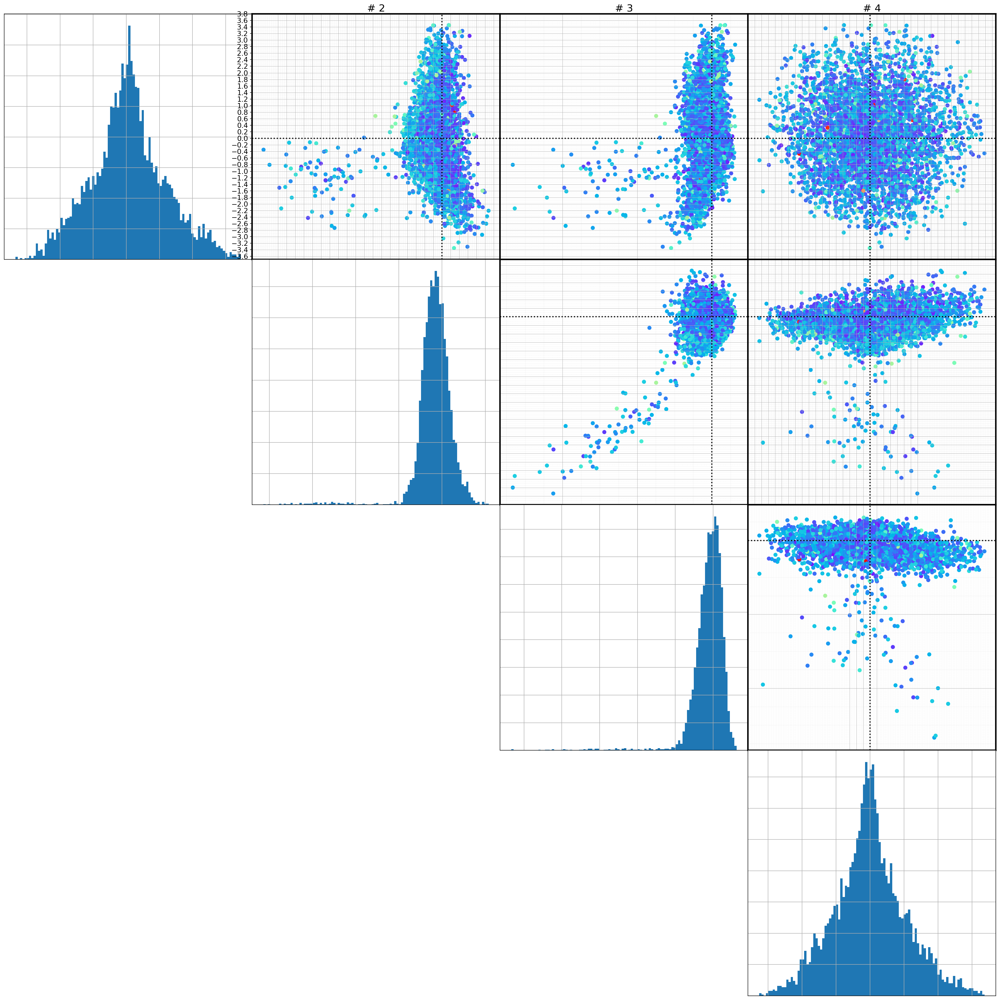

In [29]:
viz.biplots(mus, n=4, show_histo=True, nbins=100, c=metadata['_rlndefocusu'], 
            figname=KEYWORD+'/latent_space_defocus_true')

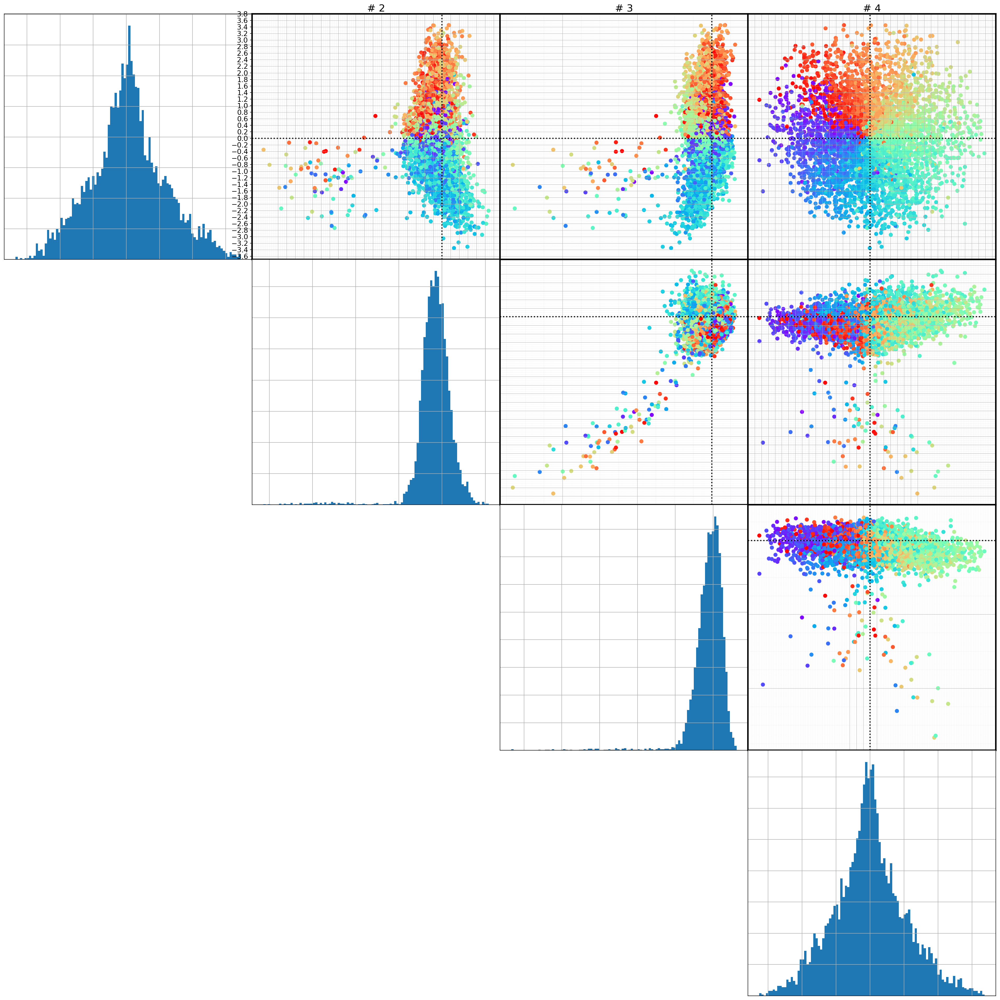

In [30]:
viz.biplots(mus, n=4, show_histo=True, nbins=100, c=metadata['_rlnanglepsi'], 
            figname=KEYWORD+'/latent_space_angle_true')

In [31]:
center = np.mean(mus,axis=0) #np.zeros(mus.shape) #
U, L, Vt = np.linalg.svd(mus - center, full_matrices=False)

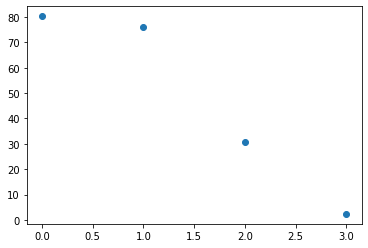

In [32]:
plt.plot(L, 'o')

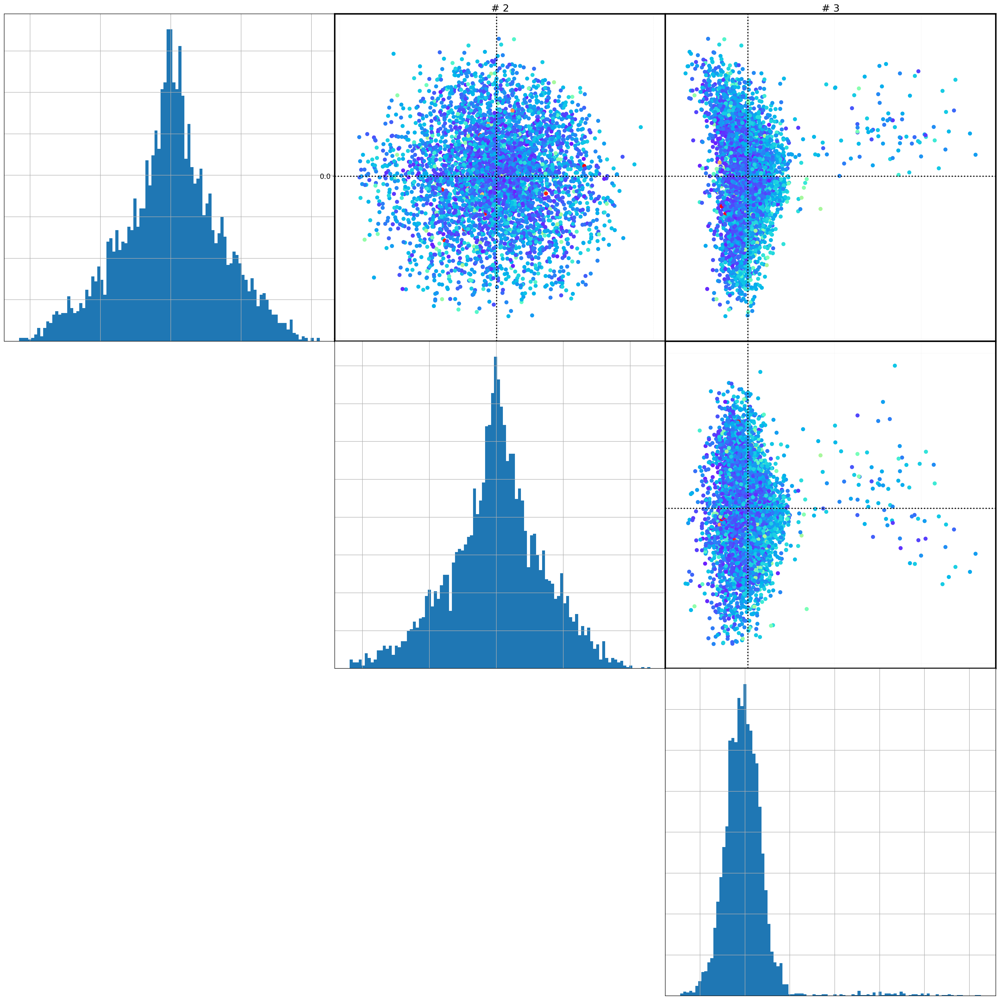

In [33]:
viz.biplots(U, n=3, show_histo=True, nbins=100, c=metadata['_rlndefocusu'], 
            figname=KEYWORD+'/latent_space_pca_defocus_true')

# Data curation

## Outlier prediction

In [34]:
Zscore_set=2

In [35]:
positives = np.where(Zscore<Zscore_set)[0]
negatives = np.where(Zscore>Zscore_set)[0]
print(positives.shape,negatives.shape)

(5090,) (29,)


AUC(robust_covar) = 0.8630919314409593
AUC(isolation_forest) = 0.8527742022898177
AUC(local_outlier_detection) = 0.6733825621570354


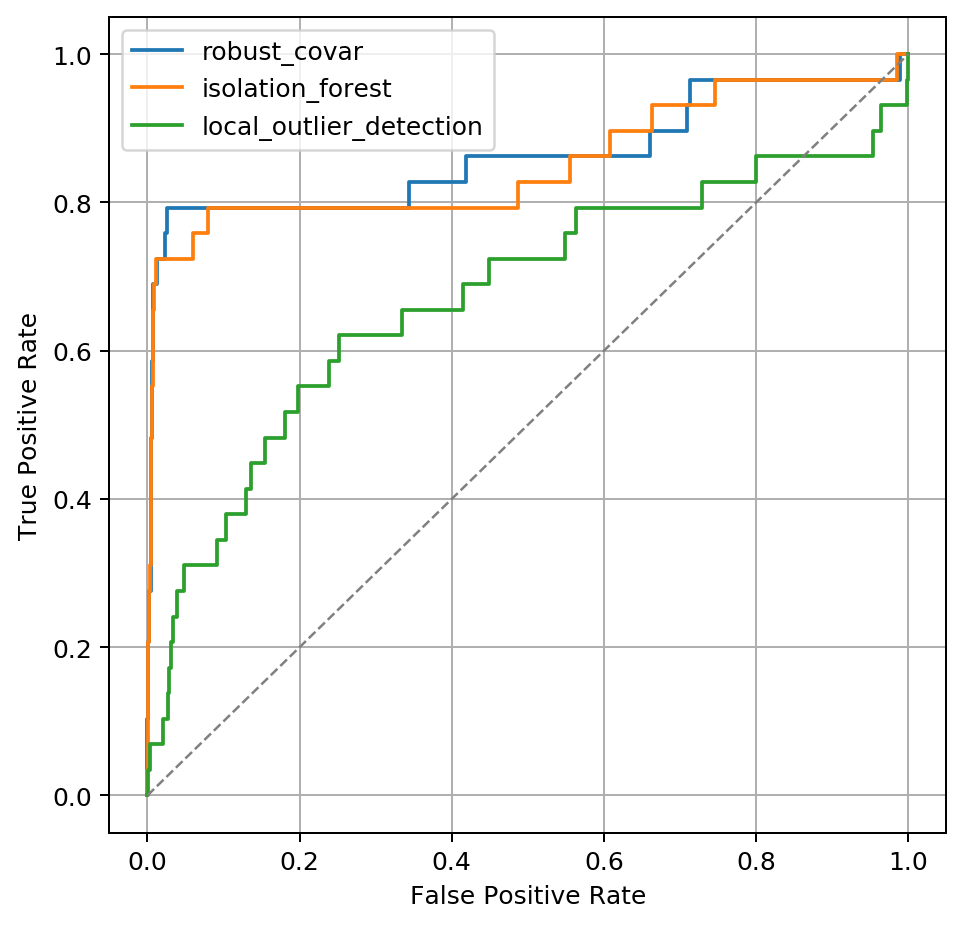

In [36]:
methods = ['robust_covar', 'isolation_forest', 'local_outlier_detection']
#
fig = plt.figure(figsize=(6,6), dpi=180)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
for method in methods:
    measure, offset, assignment = pred.outlier_measure(mus, method=method)
    fpr, tpr, thresholds = metrics.roc_curve(np.where(Zscore<Zscore_set,0,1), measure)
    plt.plot(fpr,tpr)
    print('AUC({}) = {}'.format(method, metrics.auc(fpr, tpr)))
plt.plot([0, 1], [0, 1], color='grey', lw=1, linestyle='--')
plt.legend(methods)
plt.grid()
fig.savefig(KEYWORD+'/ROC_Zscore'+str(Zscore_set))
#

In [37]:
measure, offset, assignment = pred.outlier_measure(mus, method='robust_covar')

In [ ]:
viz.biplots(mus, n=3, show_histo=True, nbins=100, c=measure, figname=KEYWORD+'/latent_space_robust_covar')

In [38]:
measure_threshold=5

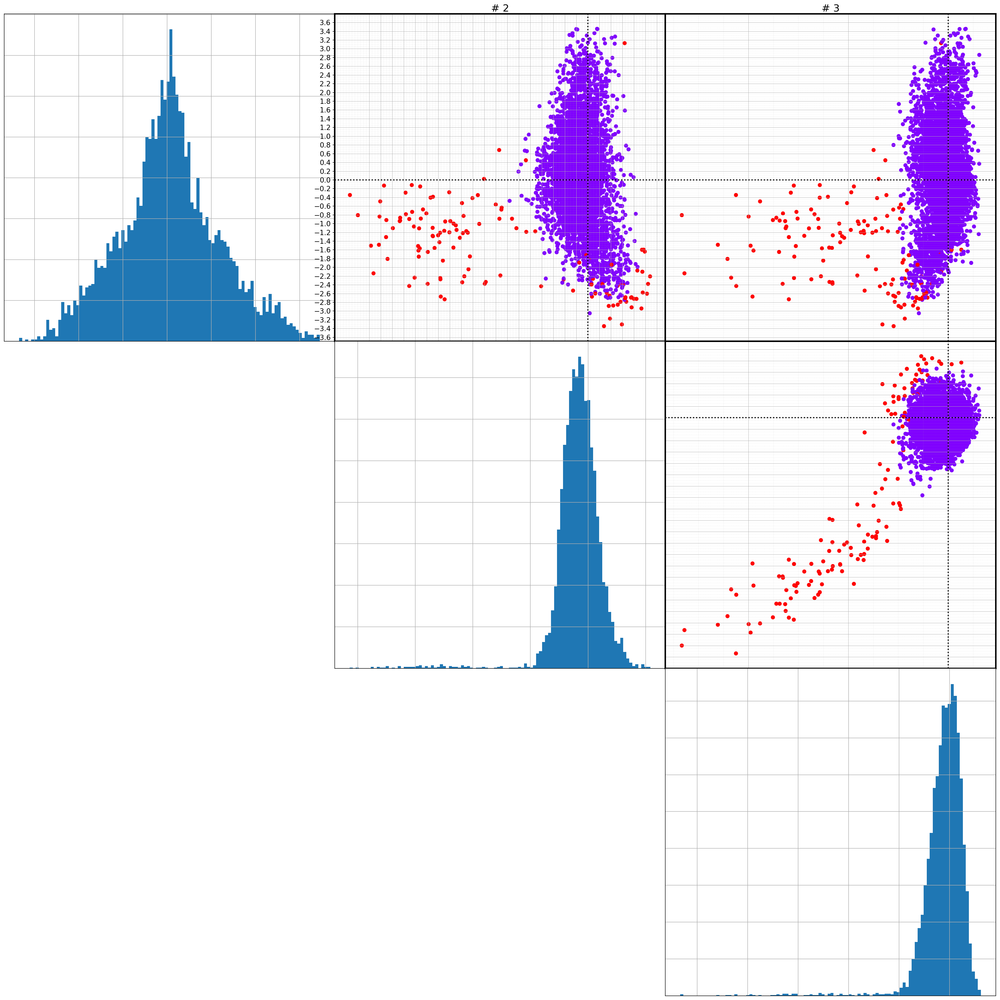

In [39]:
viz.biplots(mus, n=3, show_histo=True, nbins=100, c=np.where(measure<measure_threshold,0,1), 
            figname=KEYWORD+'/latent_space_robust_covar_assigned')

In [40]:
mus_kept = mus[np.where(measure<measure_threshold),:][0,...]
print(mus_kept.shape)
defocus_kept = np.array(metadata['_rlndefocusu'])[np.where(measure<measure_threshold)]
print(defocus_kept.shape)
angle_kept = np.array(metadata['_rlnanglepsi'])[np.where(measure<measure_threshold)]
print(angle_kept.shape)
Zscore_kept = np.array(metadata['_rlnparticleselectzscore'])[np.where(measure<measure_threshold)]
print(Zscore_kept.shape)

(4991, 4)
(4991,)
(4991,)
(4991,)


In [ ]:
viz.biplots(mus_kept, n=3, show_histo=True, nbins=100, c=defocus_kept)

In [ ]:
viz.biplots(mus_kept, n=3, show_histo=True, nbins=100, c=angle_kept)

## Remove user-defined outliers

In our case, knowledge of metadata helps getting rid of "bad" data (i.e. defocus values out of reasonable range)

In [41]:
index = np.where((defocus_kept>5000)  & (defocus_kept < 25000))[0]
mus_curated     = mus_kept[index,:]
angle_curated   = angle_kept[index]
defocus_curated = defocus_kept[index]
Zscore_curated  = Zscore_kept[index]

# Project in PCA space

In [42]:
center_curated = np.mean(mus_curated,axis=0) #np.zeros(mus.shape) #
U_curated, L_curated, Vt_curated = np.linalg.svd(mus_curated - center_curated, full_matrices=False)

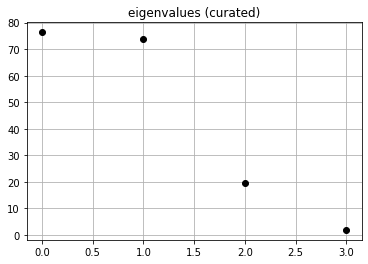

In [43]:
plt.plot(L_curated, 'ko')
plt.title('eigenvalues (curated)')
plt.grid()
plt.show()

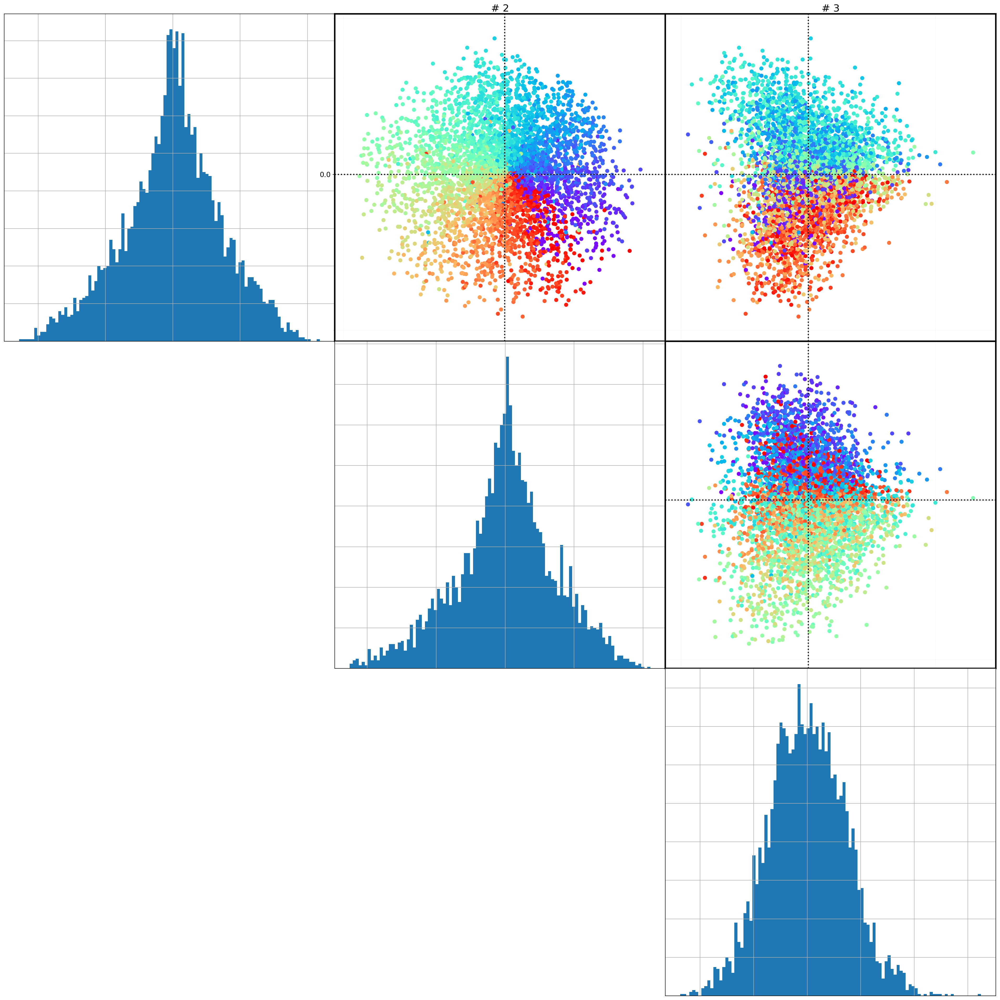

In [44]:
viz.biplots(U_curated, n=3, show_histo=True, nbins=100, c=angle_curated)

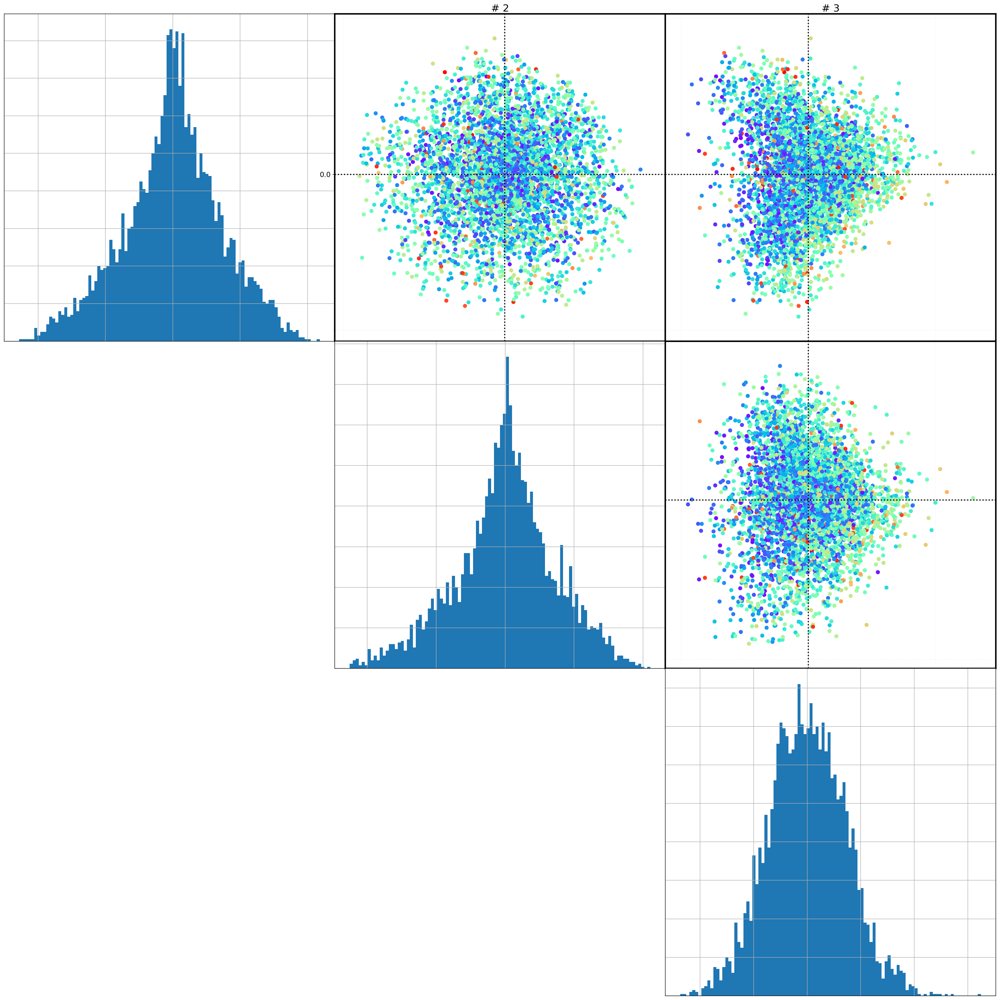

In [45]:
viz.biplots(U_curated, n=3, show_histo=True, nbins=100, c=defocus_curated)

# Parameter prediction

## Simple ellipse fitting

In [46]:
angle_true   = angle_curated + 180
defocus_true = defocus_curated

## stable portion

In [49]:
angle_pred, defocus_pred = pred.pred2d(U_curated, angle_true, defocus_true, 
                                       angle_pred_sign=-1.0,
                                       defocus_min=5000,defocus_max=25000,
                                       do_ellipse=False)

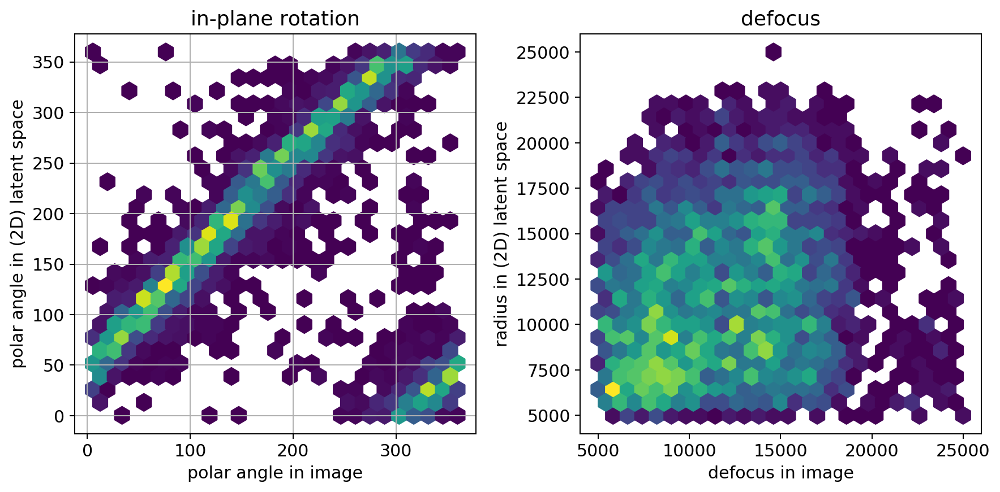

In [50]:
viz.plot_pred2d(angle_pred, defocus_pred, 
                angle_true, defocus_true, 
                figname=KEYWORD+'/polar_prediction_circle')

offset: -54.0 angle RMSE = 28.769660009101653
offset: -53.75 angle RMSE = 28.761194387454324
offset: -53.5 angle RMSE = 28.7548998980446
offset: -53.25 angle RMSE = 28.750777966868945
offset: -53.0 angle RMSE = 28.748829528414344
offset: -52.75 angle RMSE = 28.749055024599674
offset: -52.5 angle RMSE = 28.751454404274778
offset: -52.25 angle RMSE = 28.756027123278404
defocus RMSE = 5259.286765269429


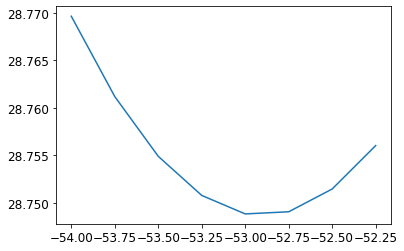

In [54]:
offset_range = np.arange(-54,-52,0.25)
angle_RMSE_list, defocus_RMSE = pred.pred2d_mse(angle_pred, defocus_pred, 
                                                angle_true, defocus_true, 
                                                angle_offset_range=offset_range)
plt.plot(offset_range,angle_RMSE_list)

### weight angle RMSE with defocus pred

In [55]:
defocus_pred_normalized = pred.rescale_to_zero_one(defocus_pred)

offset: -54.0 angle RMSE = 20.485408916714665
offset: -53.75 angle RMSE = 20.479599065098725
offset: -53.5 angle RMSE = 20.47684002082103
offset: -53.25 angle RMSE = 20.477133017059025
offset: -53.0 angle RMSE = 20.4804779228241
offset: -52.75 angle RMSE = 20.486873243254262
offset: -52.5 angle RMSE = 20.496316122951825
offset: -52.25 angle RMSE = 20.508802352348816
defocus RMSE = 5259.286765269429


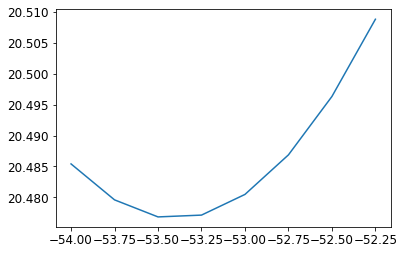

In [57]:
offset_range = np.arange(-54,-52,0.25)
angle_RMSE_list, defocus_RMSE = pred.pred2d_mse(angle_pred, defocus_pred, 
                                                angle_true, defocus_true, 
                                                angle_offset_range=offset_range,
                                                angle_weight=(np.exp(defocus_pred_normalized)-1), norm_weights=True)
plt.plot(offset_range,angle_RMSE_list)

In [ ]:
#angle_RMSE_list, defocus_RMSE = pred.pred2d_mse(angle_pred, defocus_pred, 
#                                                angle_true, defocus_true, 
#                                                angle_offset_range=np.arange(-51,-27,2.5),
#                                                angle_weight=np.exp(-np.abs(Zscore[index])), norm_weights=True)
#plt.plot(angle_RMSE_list)

## Cone fitting (ad-hoc)

In [58]:
from scipy.stats import special_ortho_group
from scipy.optimize import curve_fit

def f(x, A, B): # this is your 'straight line' y=f(x)
    return A*x + B

nsample=10000 #10000
ax = np.empty((nsample,3))
ay = np.empty((nsample,3))
az = np.empty((nsample,3))
ax[0,...] = [1,0,0]
ay[0,...] = [0,1,0]
az[0,...] = [0,0,1]
score_list = []

rotmat = np.diag([1,1,1])
U_rotated = np.dot(rotmat,U_curated[:,0:3].T).T
dist = pred.rescale_to_zero_one( np.linalg.norm(U_rotated[:,0:2],axis=1))
popt, pcov = curve_fit(f, U_rotated[:,2], dist)
#popt, pcov = curve_fit(f, U_rotated[:,2], np.linalg.norm(U_rotated[:,0:2],axis=1))
score = np.abs(popt[0])#np.sum((f(U_curated[:,0], *popt) - np.linalg.norm(U_rotated[:,1:3],axis=1))**2)
#center, axis, theta_0, score= pred.fitEllipse(U_curated)
score_min = score
rotmat_min = rotmat
center_min = center
ibest = 0
score_list.append(score)
print(ibest,score_min)
#rotmat_min = special_ortho_group.rvs(3)
for i in np.arange(1,nsample):
    rotmat = special_ortho_group.rvs(3)
    ax[i,...] = np.dot(rotmat,ax[0,...])
    ay[i,...] = np.dot(rotmat,ay[0,...])
    az[i,...] = np.dot(rotmat,az[0,...])
    U_rotated = np.dot(rotmat,U_curated[:,0:3].T).T
    dist = pred.rescale_to_zero_one( np.linalg.norm(U_rotated[:,0:2],axis=1))
    popt, pcov = curve_fit(f, U_rotated[:,2], dist)
    #popt, pcov = curve_fit(f, U_rotated[:,2], np.linalg.norm(U_rotated[:,0:2],axis=1))
    score = np.abs(popt[0]) #np.sum((f(U_curated[:,0], *popt) - np.linalg.norm(U_rotated[:,1:3],axis=1))**2)
    #center, axis, theta_0, score= pred.fitEllipse(U_curated)
    if(score > score_min):
        score_min = score
        ibest = i
        rotmat_min = rotmat
        center_min = center
        print(i,score_min)
    score_list.append(score)

0 5.984525553026781
147 6.243411402884655
539 6.3435278661400725
823 6.430170826327409


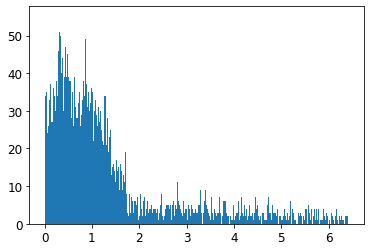

In [59]:
plt.hist(score_list, bins=np.int(nsample/10))
plt.show()

In [60]:
U_best = np.dot(rotmat_min,U_curated[:,0:3].T).T#(np.dot(rotmat_min,U_curated[:,0:3].T).T)
print(U_best.shape, U_curated.shape)

(4798, 3) (4798, 4)


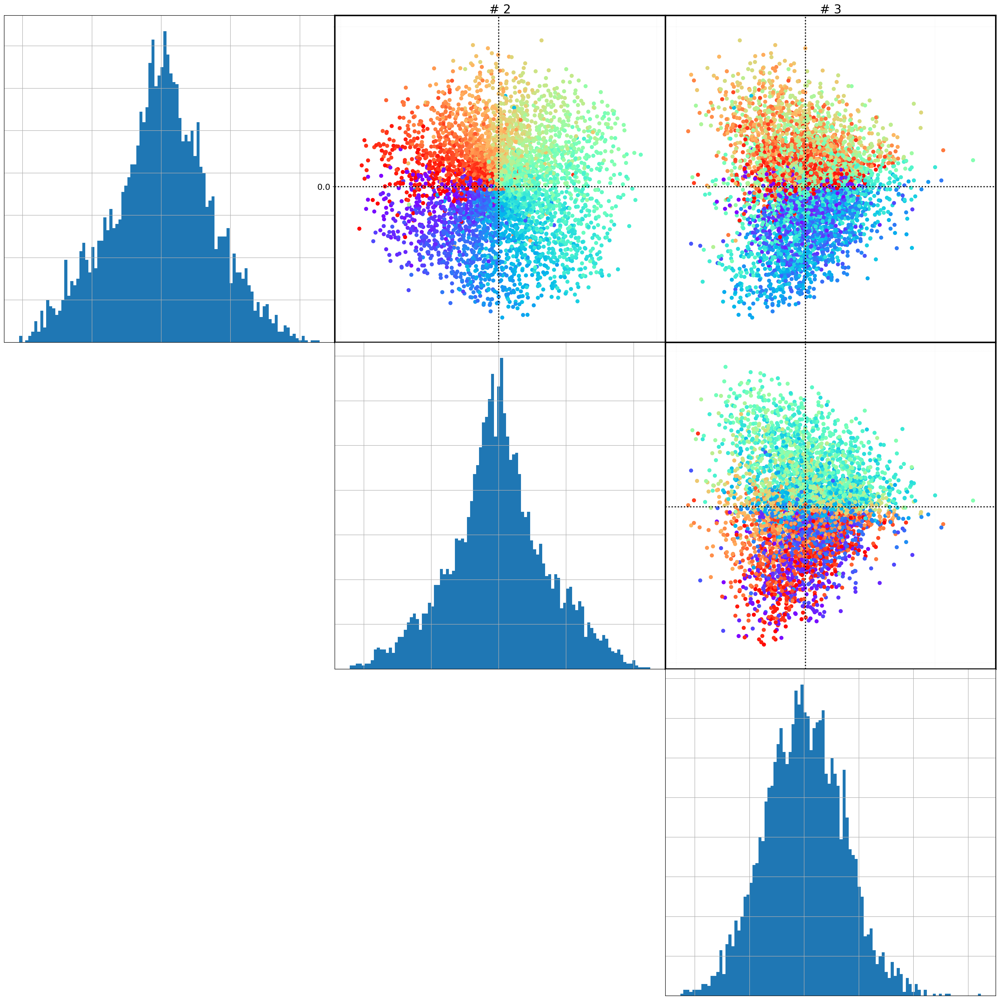

In [61]:
viz.biplots(U_best, n=3, show_histo=True, nbins=100, c=angle_true)

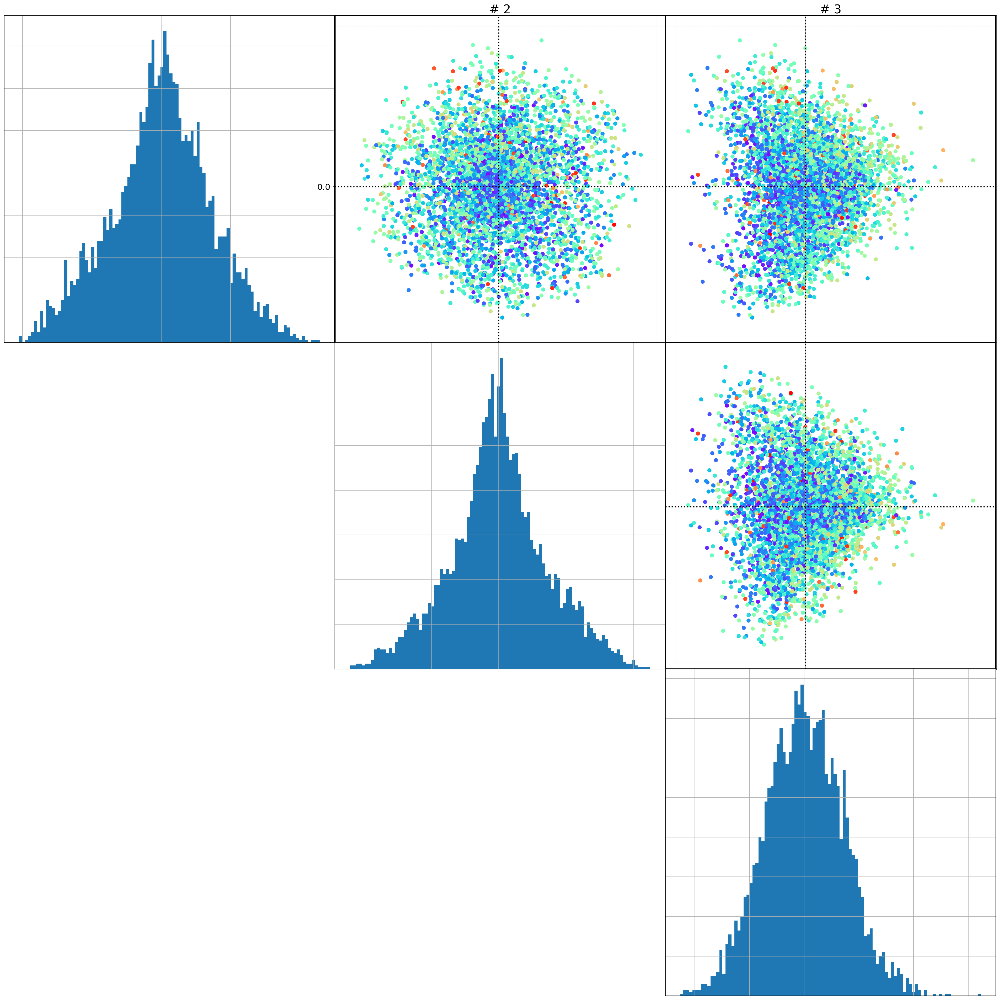

In [62]:
viz.biplots(U_best, n=3, show_histo=True, nbins=100, c=defocus_true)

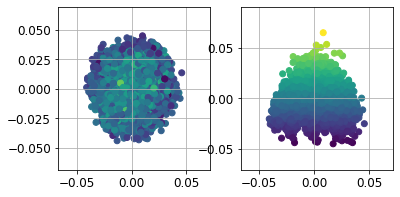

In [63]:
fig = plt.figure(figsize=(6,3))
plt.subplot(1,2,1)
plt.scatter(U_best[:,0],U_best[:,1], c=U_best[:,2])
plt.grid()
plt.subplot(1,2,2)
plt.scatter(U_best[:,0],U_best[:,2], c=U_best[:,2])
plt.grid()

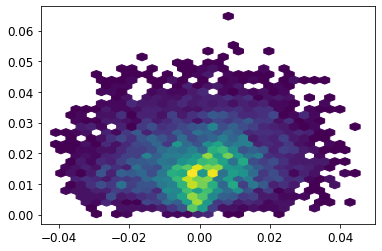

In [64]:
plt.hexbin(U_best[:,0],np.linalg.norm(U_best[:,1:3],axis=1), mincnt=1, gridsize=30)

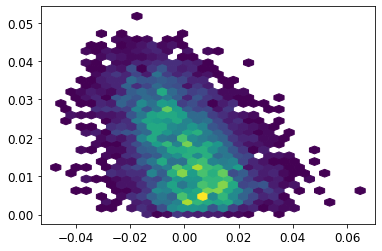

In [65]:
plt.hexbin(U_curated[:,2],np.linalg.norm(U_curated[:,0:2],axis=1), mincnt=1, gridsize=30)

In [68]:
angle_pred, defocus_pred = pred.pred2d(U_best, angle_true, defocus_true, 
                                       angle_pred_sign=-1.0,
                                       defocus_min=5000,defocus_max=25000,
                                       do_ellipse=True)

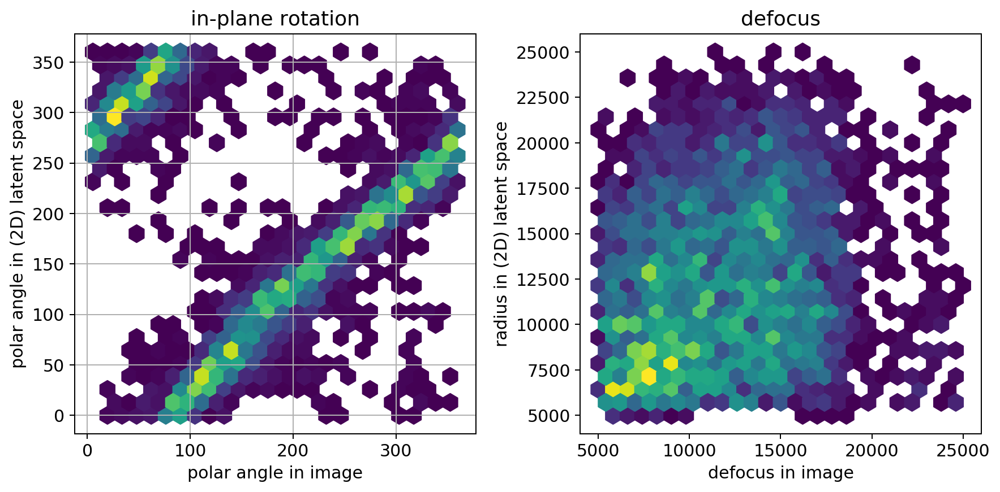

In [69]:
viz.plot_pred2d(angle_pred, defocus_pred, 
                angle_true, defocus_true, 
                figname=KEYWORD+'/polar_prediction_cone')

offset: -280.0 angle RMSE = 31.331052799335016
offset: -279.75 angle RMSE = 31.316861887245725
offset: -279.5 angle RMSE = 31.304661113242048
offset: -279.25 angle RMSE = 31.294452805010568
offset: -279.0 angle RMSE = 31.286238912901293
offset: -278.75 angle RMSE = 31.28002100806909
offset: -278.5 angle RMSE = 31.275800280973606
offset: -278.25 angle RMSE = 31.273577540240804
offset: -278.0 angle RMSE = 31.273353211888853
offset: -277.75 angle RMSE = 31.274681249019157
offset: -277.5 angle RMSE = 31.277853835363164
offset: -277.25 angle RMSE = 31.282937998737715
offset: -277.0 angle RMSE = 31.28950538950635
offset: -276.75 angle RMSE = 31.298068394184096
offset: -276.5 angle RMSE = 31.308625375351504
offset: -276.25 angle RMSE = 31.321174316765056
defocus RMSE = 5511.477614478193


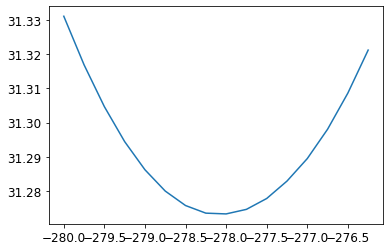

In [74]:
offset_range = np.arange(-280,-276,0.25)
angle_RMSE_list, defocus_RMSE = pred.pred2d_mse(angle_pred, defocus_pred, 
                                                angle_true, defocus_true, 
                                                angle_offset_range=offset_range)
plt.plot(offset_range,angle_RMSE_list)

In [75]:
defocus_pred_normalized = pred.rescale_to_zero_one(defocus_pred)

offset: -280.0 angle RMSE = 21.8675188106431
offset: -279.75 angle RMSE = 21.850799312785266
offset: -279.5 angle RMSE = 21.83692932354282
offset: -279.25 angle RMSE = 21.825914275356062
offset: -279.0 angle RMSE = 21.81775849231489
offset: -278.75 angle RMSE = 21.812465181697497
offset: -278.5 angle RMSE = 21.810036427675975
offset: -278.25 angle RMSE = 21.810473187217653
offset: -278.0 angle RMSE = 21.81377528820097
offset: -277.75 angle RMSE = 21.819106668984965
offset: -277.5 angle RMSE = 21.827012839387788
offset: -277.25 angle RMSE = 21.83777035792414
offset: -277.0 angle RMSE = 21.851335346934942
offset: -276.75 angle RMSE = 21.86775019710502
offset: -276.5 angle RMSE = 21.887008496406377
offset: -276.25 angle RMSE = 21.909102746587852
defocus RMSE = 5511.477614478193


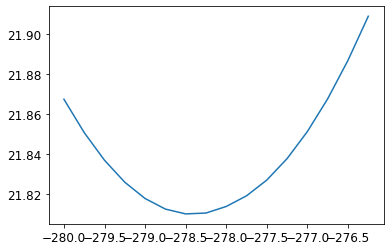

In [76]:
offset_range =  np.arange(-280,-276,0.25)
angle_RMSE_list, defocus_RMSE = pred.pred2d_mse(angle_pred, defocus_pred, 
                                                angle_true, defocus_true, 
                                                angle_offset_range=offset_range,
                                                angle_weight=(np.exp(defocus_pred_normalized)-1), norm_weights=True)
plt.plot(offset_range,angle_RMSE_list)

## Cone fitting through ellipse projective fitting (attempt)

In [ ]:
from scipy.stats import special_ortho_group
nsample=10000 #10000
ax = np.empty((nsample,3))
ay = np.empty((nsample,3))
az = np.empty((nsample,3))
ax[0,...] = [1,0,0]
ay[0,...] = [0,1,0]
az[0,...] = [0,0,1]
score_list = []
center, axis, theta_0, score= pred.fitEllipse(U_curated)
score_min = score
rotmat_min = np.diag([1,1,1])
center_min = center
ibest = 0
score_list.append(score)
print(ibest,score_min)
#rotmat_min = special_ortho_group.rvs(3)
for i in np.arange(1,nsample):
    rotmat = special_ortho_group.rvs(3)
    ax[i,...] = np.dot(rotmat,ax[0,...])
    ay[i,...] = np.dot(rotmat,ay[0,...])
    az[i,...] = np.dot(rotmat,az[0,...])
    U_rotated = np.dot(rotmat,U_curated[:,0:3].T).T
    center, axis, theta_0, score= pred.fitEllipse(U_rotated)
    if(score < score_min):
        score_min = score
        ibest = i
        rotmat_min = rotmat
        center_min = center
        print(i,score_min)
    score_list.append(score)

In [ ]:
plt.hist(score_list, bins=np.int(nsample/10))
plt.show()

In [ ]:
fig = plt.figure(figsize=(6,6))
plt.subplot(2,2,1)
plt.scatter(ax[:,1],ax[:,0],c=ax[:,2],s=0.1)
plt.scatter(ax[ibest,1],ax[ibest,0],s=100)
plt.xlabel('Y')
plt.ylabel('X')
plt.grid()
plt.subplot(2,2,2)
plt.scatter(ax[:,2],ax[:,0],c=ax[:,2],s=0.1)
plt.scatter(ax[ibest,2],ax[ibest,0],s=100)
plt.xlabel('Z')
plt.ylabel('X')
plt.grid()
plt.subplot(2,2,4)
plt.scatter(ax[:,2],ax[:,1],c=ax[:,2],s=0.1)
plt.scatter(ax[ibest,2],ax[ibest,1],s=100)
plt.xlabel('Z')
plt.ylabel('Y')
plt.grid()
plt.tight_layout()
plt.show()

In [ ]:
print(rotmat_min, center_min)

In [ ]:
U_best = np.dot(rotmat_min,U_curated[:,0:3].T).T#(np.dot(rotmat_min,U_curated[:,0:3].T).T)
print(U_best.shape, U_curated.shape)

In [ ]:
viz.biplots(U_best, n=3, show_histo=True, nbins=100, c=angle_true)

In [ ]:
angle_best, defocus_best = pred.pred2d(U_best, angle_true, defocus_true, 
                                       angle_pred_sign=1.0,
                                       defocus_min=5000,defocus_max=25000,
                                       do_ellipse=True)

In [ ]:
defocus_best

In [ ]:
print(np.linalg.norm(U_best - U_curated[:,0:3]))

In [ ]:
viz.plot_pred2d(angle_best, defocus_best, 
               angle_true, defocus_true)#, 
                #figname=KEYWORD+'/polar_prediction_ellipse_rest')

In [ ]:
angle_RMSE_list, defocus_RMSE = pred.pred2d_mse(angle_best, defocus_best, 
                                                angle_true, defocus_true, 
                                                angle_offset_range=np.arange(-300,300,20))
plt.plot(angle_RMSE_list)

## Robust cone fitting (attempt)

In [ ]:
rho, theta = viz.cart2pol(U_curated[:,0], U_curated[:,1])

In [ ]:
def f_ellipse2d(theta, p):
    a, e = p
    return a * (1 - e**2)/(1 - e*np.cos(theta))

def residuals(p, r, theta):
    """ Return the observed - calculated residuals using f(theta, p). """
    return r - f_ellipse2d(theta, p)

def jac(p, r, theta):
    """ Calculate and return the Jacobian of residuals. """
    a, e = p
    da = (1 - e**2)/(1 - e*np.cos(theta))
    de = (-2*a*e*(1-e*np.cos(theta)) + a*(1-e**2)*np.cos(theta))/(1 -
                                                        e*np.cos(theta))**2
    return -da,  -de
    return np.array((-da, -de)).T

In [ ]:
from scipy import optimize
p0 = (1, 0.5)
plsq = optimize.leastsq(residuals, p0, Dfun=jac, args=(rho, theta), col_deriv=True)
print(plsq)

In [ ]:
params, ell_coord = pred.fitEllipse(U_curated[:,0:2],1)

In [ ]:
ell_coord.shape

In [ ]:
rho_fitEll, theta_fitEll = viz.cart2pol(ell_coord[:,0],ell_coord[:,1])

In [ ]:
import pylab
pylab.polar(theta, rho, 'x')
theta_grid = np.linspace(0, 2*np.pi, 200)
pylab.polar(theta_grid, f_ellipse2d(theta_grid, plsq[0]), lw=2)
pylab.polar(theta_fitEll,rho_fitEll, 'o')
pylab.show()

## General quadric fitting

In [ ]:
# eventually just keep the first data points (for rapid testing)
sub_sample = U_curated.shape[0] 
# define data array to be fitted
data = U_curated[0:sub_sample,0:3]
# add t vector to data, and define y=0 vector
x = np.concatenate((data.T,np.ones((1,data.shape[0]))),axis=0)
y = np.zeros(data.shape[0])
print(x.shape, y.shape)

In [ ]:
viz.biplots(data, n=3, show_histo=True, nbins=100, c=angle_curated[0:sub_sample])

In [ ]:
dim = x.shape[0]
popt, pcov = pred.curve_fit(pred.quadric_model,
                       x,y,
                       p0=np.ones((np.int(dim*(dim+1)/2))) #p0=[1,-1,-1,0,0,0,0,0,0,0.1]
                      )

In [ ]:
fitData = pred.quadric_model(x, *popt)
plt.hist(fitData, bins=100)
plt.show()

In [ ]:
A = pred.quadric_matrix(4,*popt)
print(A)
plt.imshow(A)
plt.colorbar()
plt.show()

In [ ]:
D, P = np.linalg.eig(A)
print(np.linalg.det(np.diag(D)), np.linalg.matrix_rank(A))
plt.plot(D, 'X')
plt.grid()
plt.show()
plt.imshow(P)
plt.colorbar()

### Projection in reduced space

In [ ]:
x_oriented = np.dot(P,x).T
x_oriented.shape

In [ ]:
viz.biplots(x_oriented, n=4, show_histo=True, nbins=100, c=defocus_curated[0:sub_sample])

In [ ]:
viz.biplots(x_oriented, n=4, show_histo=True, nbins=100, c=angle_curated[0:sub_sample])

### Final rescaling 

In [ ]:
x_scaled = np.copy(x_oriented)
for i in np.arange(3):
    x_scaled[:,i] /= x_oriented[:,3]
    #x_scaled[:,i] /= 1e12*np.maximum(x_oriented[:,3],1e-12)

In [ ]:
viz.biplots(x_scaled, n=3, show_histo=True, nbins=100, c=defocus_curated[0:sub_sample])

In [ ]:
viz.biplots(x_scaled, n=3, show_histo=True, nbins=100, c=angle_curated[0:sub_sample])